In [1]:
! [ -e /content ] && pip install -Uqq fastai  # upgrade fastai on colab

In [3]:
#hide
# !pip install -Uqq fastbook
import fastbook
fastbook.setup_book()
from fastbook import *

from fastai.vision import *
from fastai.metrics import error_rate
from fastai.callback import *
from fastai.layers import *
from fastai.vision.learner import *

from fastai.basics import *
from fastai.vision.core import *
from fastai.vision.data import *
from fastai.vision.augment import *
from fastai.vision import *
from fastai.learner import *
 
from fastai.callback import *
from fastai.basics import *

from nbdev.showdoc import *

<function fastai.optimizer.Adam(params, lr, mom=0.9, sqr_mom=0.99, eps=1e-05, wd=0.01, decouple_wd=True)>

In [ ]:
def search_images_ddg2(key,max_n=200):
     """Search for 'key' with DuckDuckGo and return a unique urls of 'max_n' images
        (Adopted from https://github.com/deepanprabhu/duckduckgo-images-api)
     """
     url        = 'https://duckduckgo.com/'
     params     = {'q':key}
     res        = requests.post(url,data=params)
     searchObj  = re.search(r'vqd=([\d-]+)\&',res.text)
     if not searchObj: print('Token Parsing Failed !'); return
     requestUrl = url + 'i.js'
     headers    = {'User-Agent': 'Mozilla/5.0 (X11; Ubuntu; Linux x86_64; rv:71.0) Gecko/20100101 Firefox/71.0'}
     params     = (('l','us-en'),('o','json'),('q',key),('vqd',searchObj.group(1)),('f',',,,'),('p','1'),('v7exp','a'))
     urls       = []
     while True:
         try:
             res  = requests.get(requestUrl,headers=headers,params=params)
             data = json.loads(res.text)
             for obj in data['results']:
                 urls.append(obj['image'])
                 max_n = max_n - 1
                 if max_n < 1: return L(set(urls))     # dedupe
             if 'next' not in data: return L(set(urls))
             requestUrl = url + data['next']
         except:
             pass

In [52]:
_default_meta    = {'cut':None, 'split':default_split}

def _add_norm(dls, meta, pretrained):
    if not pretrained: return
    stats = meta.get('stats')
    print(stats)
    if stats is None: return
    dls.after_batch([Normalize.from_stats(*stats)])


def create_head(nf, n_out, lin_ftrs=None, ps=0.5, concat_pool=True, first_bn=True, bn_final=False,
                lin_first=False, y_range=None):
    "Model head that takes `nf` features, runs through `lin_ftrs`, and out `n_out` classes."
    if concat_pool: nf *= 2
    lin_ftrs = [nf, 512, n_out] if lin_ftrs is None else [nf] + lin_ftrs + [n_out]
    bns = [first_bn] + [True]*len(lin_ftrs[1:])
    ps = L(ps)
    if len(ps) == 1: ps = [ps[0]/2] * (len(lin_ftrs)-2) + ps
    actns = [nn.ReLU(inplace=True)] * (len(lin_ftrs)-2) + [None]
    pool = AdaptiveConcatPool2d() if concat_pool else nn.AdaptiveAvgPool2d(1)
    layers = [pool, nn.Flatten()]
    if lin_first: layers.append(nn.Dropout(ps.pop(0)))
    for ni,no,bn,p,actn in zip(lin_ftrs[:-1], lin_ftrs[1:], bns, ps, actns):
        layers += LinBnDrop(ni, no, bn=bn, p=p, act=actn, lin_first=lin_first)
    if lin_first: layers.append(nn.Linear(lin_ftrs[-2], n_out))
    if bn_final: layers.append(nn.BatchNorm1d(lin_ftrs[-1], momentum=0.01))
    if y_range is not None: layers.append(SigmoidRange(*y_range))
    return nn.Sequential(*layers)

def create_cnn_model(arch, n_out, pretrained=True, cut=None, n_in=3, init=nn.init.kaiming_normal_, custom_head=None,
                     concat_pool=True, **kwargs):
    "Create custom convnet architecture"
    meta = model_meta.get(arch, _default_meta)
    body = create_body(arch, n_in, pretrained, ifnone(cut, meta['cut']))
    if custom_head is None:
        nf = num_features_model(nn.Sequential(*body.children()))
        head = create_head(nf, n_out, concat_pool=concat_pool, **kwargs)
    else: head = custom_head
    model = nn.Sequential(body, head)
    if init is not None: apply_init(model[1], init)
    return model

def cnn_learner(dls, arch, normalize=True, n_out=None, pretrained=True, config=None,
                # learner args
                loss_func=None, opt_func=Adam, lr=defaults.lr, splitter=None, cbs=None, metrics=None, path=None,
                model_dir='models', wd=None, wd_bn_bias=False, train_bn=True, moms=(0.95,0.85,0.95),
                # other model args
                **kwargs):
    "Build a convnet style learner from `dls` and `arch`"

    if config:
        warnings.warn('config param is deprecated. Pass your args directly to cnn_learner.')
        kwargs = {**config, **kwargs}

    meta = model_meta.get(arch, _default_meta)
    if normalize: _add_norm(dls, meta, pretrained)

    if n_out is None: n_out = get_c(dls)
    assert n_out, "`n_out` is not defined, and could not be inferred from data, set `dls.c` or pass `n_out`"
    model = create_cnn_model(arch, n_out, pretrained=pretrained, **kwargs)

    splitter=ifnone(splitter, meta['split'])
    learn = Learner(dls=dls, model=model, loss_func=loss_func, opt_func=opt_func, lr=lr, splitter=splitter, cbs=cbs,
                   metrics=metrics, path=path, model_dir=model_dir, wd=wd, wd_bn_bias=wd_bn_bias, train_bn=train_bn,
                   moms=moms)
    if pretrained: learn.freeze()
    # keep track of args for loggers
    store_attr('arch,normalize,n_out,pretrained', self=learn, **kwargs)
    return learn

learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])


epoch,train_loss,valid_loss,error_rate,time
0,2.768923,1.525199,0.535817,00:10


epoch,train_loss,valid_loss,error_rate,time
0,1.424349,1.032217,0.369628,00:07
1,1.078130,0.632618,0.194842,00:08
2,0.842131,0.510384,0.171920,00:08
3,0.653044,0.498864,0.157593,00:08


In [25]:
# # from https://github.com/davidpfahler/react-ml-app/blob/master/train_dog_classifier_with_fastai_export_to_ONNX.ipynb
# def create_head(nf, nc, lin_ftrs=None, ps=0.5,
#                 concat_pool=True, bn_final=False):
#     "Model head that takes `nf` features, runs through `lin_ftrs`, and about `nc` classes."
#     lin_ftrs = [nf, 512, nc] if lin_ftrs is None else [nf] + lin_ftrs + [nc]
#     ps = listify(ps)
#     if len(ps) == 1: ps = [ps[0]/2] * (len(lin_ftrs)-2) + ps
#     actns = [nn.ReLU(inplace=True)] * (len(lin_ftrs)-2) + [None]
#     pool = AdaptiveConcatPool2d() if concat_pool else nn.AdaptiveAvgPool2d(1)
#     layers = [pool, nn.Flatten()]
#     for ni,no,p,actn in zip(lin_ftrs[:-1], lin_ftrs[1:], ps, actns):
#         #layers += bn_drop_lin(ni, no, True, p, actn)
#         layers += LinBnDrop(ni, no, True, p, actn)
        
#     if bn_final: layers.append(nn.BatchNorm1d(lin_ftrs[-1], momentum=0.01))
#     return nn.Sequential(*layers)

# def create_cnn_model(base_arch, nc, cut=None, pretrained=True,
#                      lin_ftrs=None, ps=0.5, custom_head=None,
#                      bn_final=False, concat_pool=True):
#     "Create custom convnet architecture"
#     body = create_body(base_arch, pretrained, cut)
#     if custom_head is None:
#         nf = num_features_model(nn.Sequential(*body.children())) * (2 if concat_pool else 1)
#         head = create_head(nf, nc, lin_ftrs, ps=ps, concat_pool=concat_pool, bn_final=bn_final)
#     else: head = custom_head
#     return nn.Sequential(body, head)

# def cnn_learner(data, base_arch, cut=None, pretrained=True,
#                 lin_ftrs=None, ps=0.5, custom_head=None,
#                 split_on=None, bn_final=False, init=nn.init.kaiming_normal_,
#                 concat_pool:bool=True, **kwargs)->Learner:
#     "Build convnet style learner."
#     meta = cnn_config(base_arch)
#     model = create_cnn_model(base_arch, data.c, cut, pretrained, lin_ftrs, ps=ps, custom_head=custom_head,
#         bn_final=bn_final, concat_pool=concat_pool)
#     learn = Learner(data, model, **kwargs)
#     learn.split(split_on or meta['split'])
#     if pretrained: learn.freeze()
#     if init: apply_init(model[1], init)
#     return learn

In [26]:
item_types = 'Ignazio Cassis', 'Simonetta Sommaruga', 'Alain Berset', 'Viola Amherd', 'Karin Keller-Sutter', 'Ueli Maurer', 'Guy Parmelin'
path = Path('bundesrat')

In [27]:
# if not path.exists():
#     path.mkdir()
# for o in item_types:
#     dest = (path/o)
#     print(dest)
#     dest.mkdir(exist_ok=True)
#     results = search_images_ddg2(f'{o}')
#     download_images(dest, urls=results)

In [28]:
fns = get_image_files(path)

In [29]:
# pngs = list(filter(lambda k: k.name.endswith("png"), fns))
# pngs.map(Path.unlink);

In [30]:
# failed = verify_images(fns)
# failed

In [31]:
# failed.map(Path.unlink);

In [41]:
items = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.3, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [42]:
dls = items.dataloaders(path)

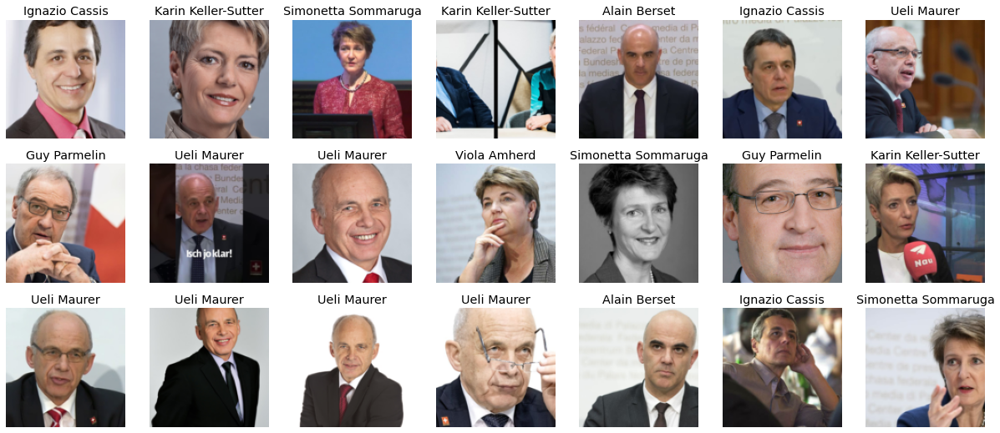

In [43]:
dls.valid.show_batch(max_n=21, nrows=3)

In [44]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])


AttributeError: add_tfms

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [ ]:
loss, idxs = interp.top_losses(10)
idxs

for i  in idxs:
    print(Path(dls.items[i]))

In [ ]:
interp.plot_top_losses(21, nrows=21)

In [53]:
torch.onnx.export(
    learn.model,
    torch.randn(1, 3, 299, 299).cuda(),
    "bundesrat.onnx",
    input_names=["image"],
    output_names=["bundesrats"]
)

In [25]:
with open("bundesrat.vocab.txt", "w") as f:
    f.write("\n".join(list(learn.dls.vocab)))

In [54]:
learn.model

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

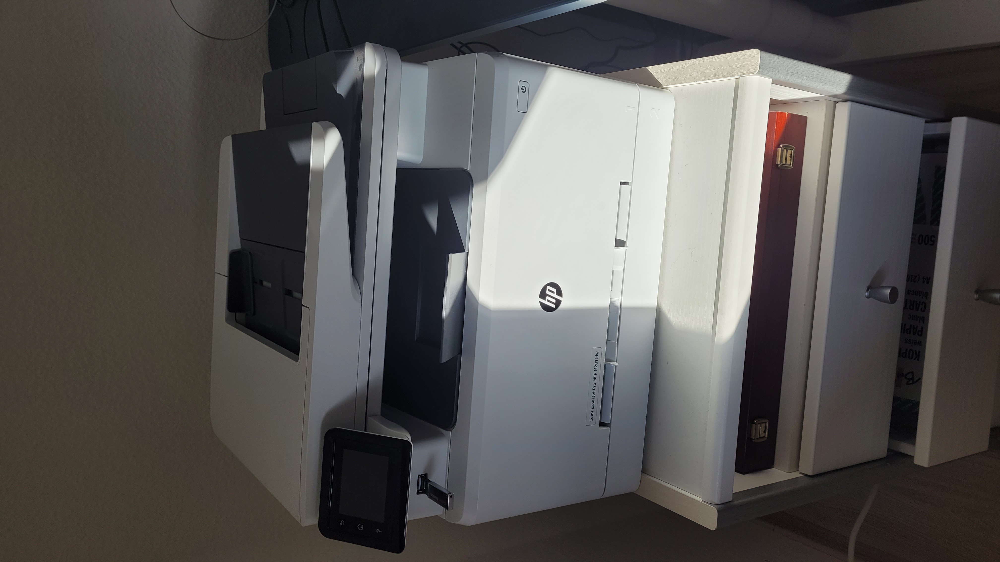

In [20]:
uploader = SimpleNamespace(data = ['../Temp/printera.jpg'])
img = PILImage.create(uploader.data[0])
img

In [21]:
is_what,_,probs = learn.predict(img)
print(f"{is_what}")
print(f"Probability it's a {is_what}: {probs[1].item():.6f}")

color laserjet pro mpf w281fdw
Probability it's a color laserjet pro mpf w281fdw: 0.935157


In [12]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [13]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [42]:
get_image_files(path)

(#1146) [Path('bundesrat/Guy Parmelin/00000047.jpg'),Path('bundesrat/Guy Parmelin/00000154.jpg'),Path('bundesrat/Guy Parmelin/00000085.png'),Path('bundesrat/Guy Parmelin/00000159.jpg'),Path('bundesrat/Guy Parmelin/00000108.JPG'),Path('bundesrat/Guy Parmelin/00000107.jpg'),Path('bundesrat/Guy Parmelin/00000036.jpg'),Path('bundesrat/Guy Parmelin/00000030.jpg'),Path('bundesrat/Guy Parmelin/00000110.jpg'),Path('bundesrat/Guy Parmelin/00000142.JPG')...]

## From Data to DataLoaders

In [ ]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [ ]:
dls = bears.dataloaders(path)

In [ ]:
dls.valid.show_batch(max_n=4, nrows=1)

In [ ]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

In [ ]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

In [ ]:
bears = bears.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

### Data Augmentation

In [ ]:
bears = bears.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

## Training Your Model, and Using It to Clean Your Data

In [ ]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = bears.dataloaders(path)

In [ ]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [ ]:
interp.plot_top_losses(5, nrows=1)

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
#hide
# for idx in cleaner.delete(): cleaner.fns[idx].unlink()
# for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

## Turning Your Model into an Online Application

### Using the Model for Inference

In [ ]:
learn.export()

In [ ]:
path = Path()
path.ls(file_exts='.pkl')

In [ ]:
learn_inf = load_learner(path/'export.pkl')

In [ ]:
learn_inf.predict('images/grizzly.jpg')

In [ ]:
learn_inf.dls.vocab

### Creating a Notebook App from the Model

In [ ]:
btn_upload = widgets.FileUpload()
btn_upload

In [ ]:
#hide
# For the book, we can't actually click an upload button, so we fake it
btn_upload = SimpleNamespace(data = ['images/grizzly.jpg'])

In [ ]:
img = PILImage.create(btn_upload.data[-1])

In [ ]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

In [ ]:
pred,pred_idx,probs = learn_inf.predict(img)

In [ ]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

In [ ]:
btn_run = widgets.Button(description='Classify')
btn_run

In [ ]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [ ]:
#hide
#Putting back btn_upload to a widget for next cell
btn_upload = widgets.FileUpload()

In [ ]:
VBox([widgets.Label('Select your bear!'), 
      btn_upload, btn_run, out_pl, lbl_pred])

### Turning Your Notebook into a Real App

In [ ]:
#hide
# !pip install voila
# !jupyter serverextension enable --sys-prefix voila 

### Deploying your app

## How to Avoid Disaster

### Unforeseen Consequences and Feedback Loops

## Get Writing!

## Questionnaire

1. Provide an example of where the bear classification model might work poorly in production, due to structural or style differences in the training data.
1. Where do text models currently have a major deficiency?
1. What are possible negative societal implications of text generation models?
1. In situations where a model might make mistakes, and those mistakes could be harmful, what is a good alternative to automating a process?
1. What kind of tabular data is deep learning particularly good at?
1. What's a key downside of directly using a deep learning model for recommendation systems?
1. What are the steps of the Drivetrain Approach?
1. How do the steps of the Drivetrain Approach map to a recommendation system?
1. Create an image recognition model using data you curate, and deploy it on the web.
1. What is `DataLoaders`?
1. What four things do we need to tell fastai to create `DataLoaders`?
1. What does the `splitter` parameter to `DataBlock` do?
1. How do we ensure a random split always gives the same validation set?
1. What letters are often used to signify the independent and dependent variables?
1. What's the difference between the crop, pad, and squish resize approaches? When might you choose one over the others?
1. What is data augmentation? Why is it needed?
1. What is the difference between `item_tfms` and `batch_tfms`?
1. What is a confusion matrix?
1. What does `export` save?
1. What is it called when we use a model for getting predictions, instead of training?
1. What are IPython widgets?
1. When might you want to use CPU for deployment? When might GPU be better?
1. What are the downsides of deploying your app to a server, instead of to a client (or edge) device such as a phone or PC?
1. What are three examples of problems that could occur when rolling out a bear warning system in practice?
1. What is "out-of-domain data"?
1. What is "domain shift"?
1. What are the three steps in the deployment process?

### Further Research

1. Consider how the Drivetrain Approach maps to a project or problem you're interested in.
1. When might it be best to avoid certain types of data augmentation?
1. For a project you're interested in applying deep learning to, consider the thought experiment "What would happen if it went really, really well?"
1. Start a blog, and write your first blog post. For instance, write about what you think deep learning might be useful for in a domain you're interested in.